# Machine Learning Project on Winequality-red.

### by Shubham Palkar 


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings("ignore")

# Exploratory Data Analysis(EDA)
Exploratory data analysis (EDA) is used by data scientists to analyze and investigate data sets and summarize their main characteristics, often employing data visualization methods.

In [2]:
#for reading csv file
df=pd.read_csv("winequality-red.csv")
#to read first 5 rows
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
#shape
df.shape

(1599, 12)

In [4]:
#info():-This method prints information about a DataFrame including the index dtype and column dtypes,
#non-null values and memory usage.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [5]:
#df.columns :-As we can see in the output, the DataFrame.columns attribute has successfully 
#returned all of the column labels of the given dataframe
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [6]:
#df.isnull().sum() ;-The function dataframe. isnull(). sum(). sum() returns the number of missing values in the data set.
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
# describe():-Is used to view some basic statistical details like percentile, 
#mean, std etc. of a data frame or a series of numeric values.
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


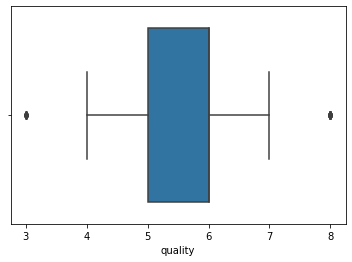

In [8]:
# Outliers:-An outlier is an object that deviates significantly from the rest of the objects. 
#They can be caused by measurement or execution error
# numerical column

plt.figure()
sns.boxplot(df["quality"])
plt.show()

In [9]:
q1=np.quantile(df["quality"],0.25)
q3=np.quantile(df["quality"],0.75)
print(q1)
print(q3)

5.0
6.0


In [10]:
iqr=q3-q1
uw=q3+(1.5*iqr)
lw=q1-(1.5*iqr)
print(uw)
print(lw)

7.5
3.5


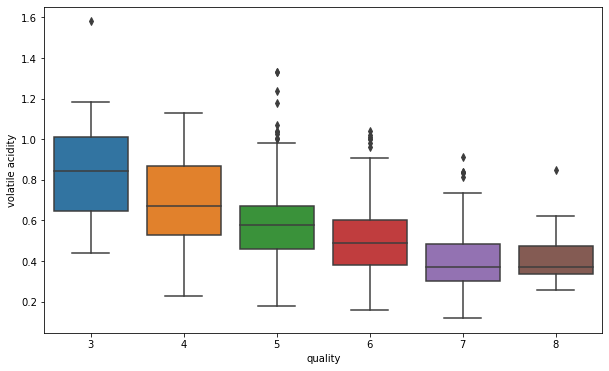

In [11]:
# remove all outliers
# remove some outliers

plt.figure(figsize=(10,6))
sns.boxplot(data=df, x="quality",y="volatile acidity")
plt.show()

In [12]:
#here we remove all outliers 
for make in df["quality"].unique():
    price = df[df["quality"] == make]["volatile acidity"]
    q1 = np.quantile(price,0.25)
    q3 = np.quantile(price,0.75)
    iqr = q3-q1
    uw = q3+(1.5*iqr)
    
    index = price[price > uw].index
    if len(index) != 0:
        df.drop(index, inplace=True)

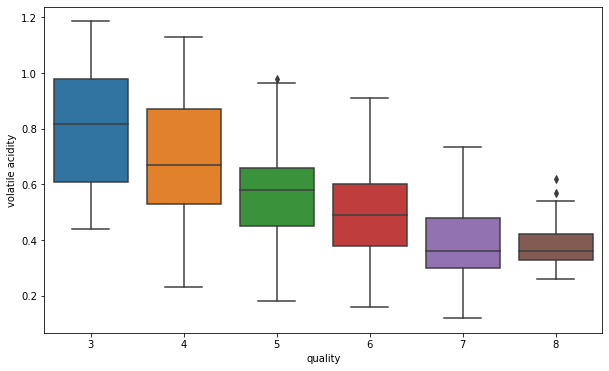

In [13]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x="quality",y="volatile acidity")
plt.show()

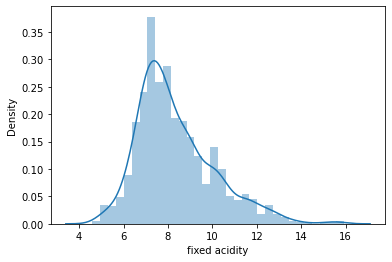

skewness: 0.985508263954696


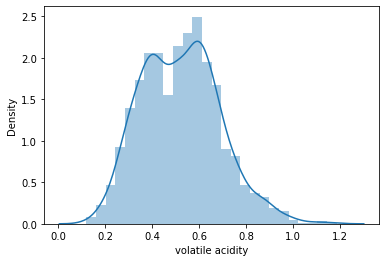

skewness: 0.356916983478699


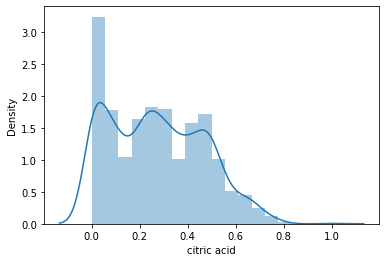

skewness: 0.30562170141820066


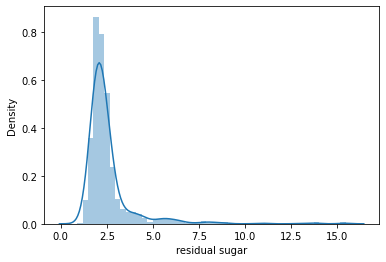

skewness: 4.5308014777811465


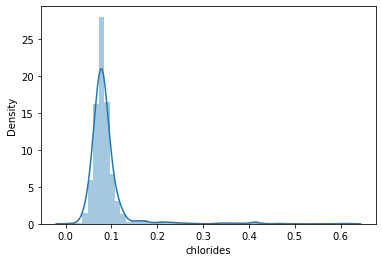

skewness: 5.684331351159614


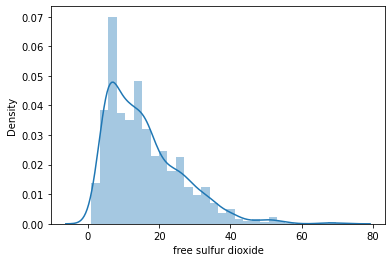

skewness: 1.2535254282369195


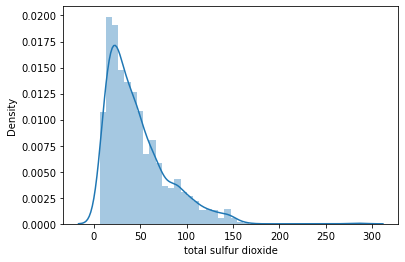

skewness: 1.5259289659685455


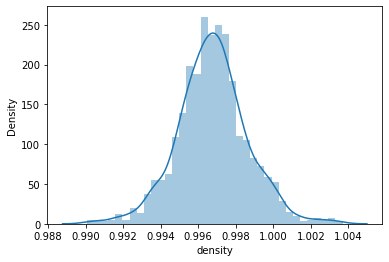

skewness: 0.07307358663885302


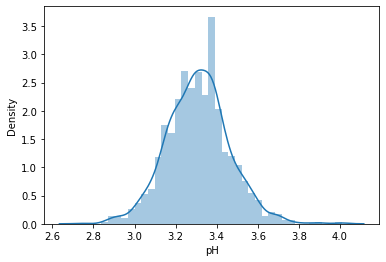

skewness: 0.1927133337055866


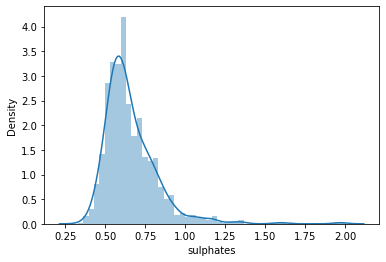

skewness: 2.436284447791584


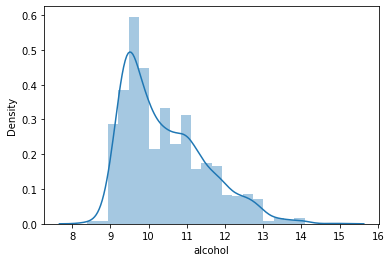

skewness: 0.8702383786246497


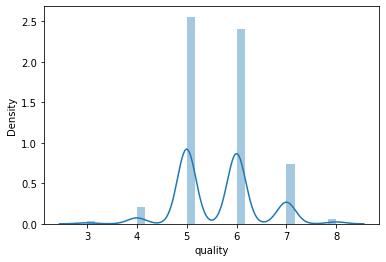

skewness: 0.2245006875089668


In [14]:
#skewness:-Skewness refers to a distortion or asymmetry that deviates from the symmetrical bell curve,
#or normal distribution, in a set of data
df_num = df.select_dtypes(["int64","float64"])
for col in df_num:
    plt.figure()
    sns.distplot(df_num[col])
    plt.show()
    print("skewness:",skew(df_num[col]))

In [15]:
#pandas profiling:- Pandas profiling is an open source Python module with which we can quickly do an
#exploratory data analysis with just a few lines of code. 
import pandas_profiling as pp
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# K-Nearest Neighbor(KNN) Algorithm 
K-nearest neighbors (KNN) algorithm is a type of supervised ML algorithm which can be used for both classification as well as regression predictive problems. However, it is mainly used for classification predictive problems in industry. The following two properties would define KNN well −

Lazy learning algorithm − KNN is a lazy learning algorithm because it does not have a specialized training phase and uses all the data for training while classification.

Non-parametric learning algorithm − KNN is also a non-parametric learning algorithm because it doesn’t assume anything about the underlying data.

In [16]:
#Next, we will divide the data into train and test split. Following code will split the dataset into
#60% training data and 40% of testing data −
X=df.drop("quality",axis=1)
y=df["quality"]
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=1)


In [17]:
#Next, data scaling will be done as follows −
for col in X:
    ss = StandardScaler()
    X_train[col] = ss.fit_transform(X_train[[col]])
    X_test[col] = ss.transform(X_test[[col]])

In [18]:
#Next, train the model with the help of KNeighborsClassifier class of sklearn as follows −
neighbors = [3,5,7,9,11,13,15]

train_scores = []
test_scores = []

for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)
    
    train_score = knn.score(X_train,y_train) 
    test_score = knn.score(X_test,y_test)
    
    train_scores.append(train_score)
    test_scores.append(test_score)


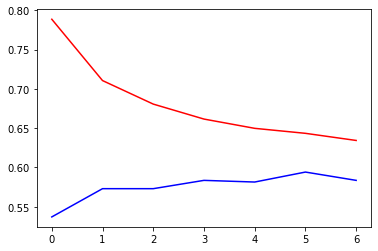

In [19]:
plt.figure()
plt.plot(train_scores, color="red")
plt.plot(test_scores, color="blue")
plt.show()

In [20]:
# Final model:-At last we need to make prediction. It can be done with the help of following script −
knn = KNeighborsClassifier(n_neighbors=3)

knn.fit(X_train,y_train)

y_pred = knn.predict(X_test)

In [21]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.18      0.13      0.15        15
           5       0.59      0.64      0.62       194
           6       0.51      0.52      0.52       193
           7       0.52      0.39      0.45        66
           8       0.00      0.00      0.00         3

    accuracy                           0.54       473
   macro avg       0.30      0.28      0.29       473
weighted avg       0.53      0.54      0.53       473



# LOGISTIC REGRESSION
Logistic Regression is a “Supervised machine learning” algorithm that can be used to model the probability of a certain class or event. It is used when the data is linearly separable and the outcome is binary or dichotomous in nature.
That means Logistic regression is usually used for Binary classification problems.
Binary Classification refers to predicting the output variable that is discrete in two classes.
A few examples of Binary classification are Yes/No, Pass/Fail, Win/Lose, Cancerous/Non-cancerous, etc.

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [23]:
# model

model = LogisticRegression(random_state=1)
model.fit(X_train,y_train)

LogisticRegression(random_state=1)

In [24]:
# train score

model.score(X_train, y_train)

0.5970961887477314

In [25]:
# prediction on test

y_pred = model.predict(X_test)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.50      0.13      0.21        15
           5       0.66      0.78      0.72       194
           6       0.59      0.63      0.61       193
           7       0.63      0.33      0.44        66
           8       0.00      0.00      0.00         3

    accuracy                           0.63       473
   macro avg       0.40      0.31      0.33       473
weighted avg       0.62      0.63      0.61       473



# Decision Tree
Decision Trees (DTs) are a non-parametric supervised learning method used for 
1.classification 
2.regression
The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.

In [26]:
from sklearn.tree import DecisionTreeClassifier

In [27]:
# feature and target
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

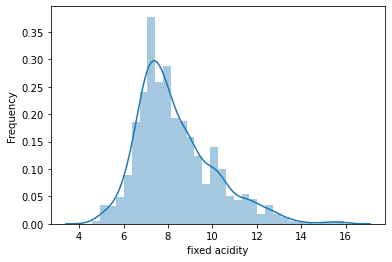

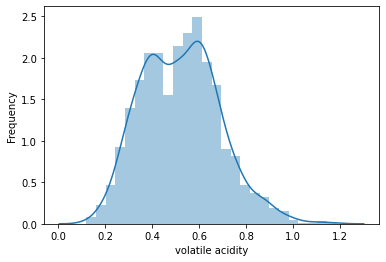

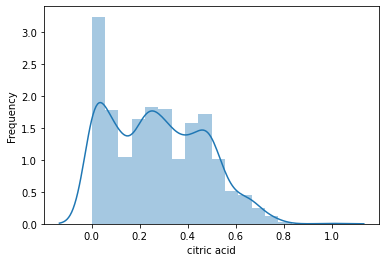

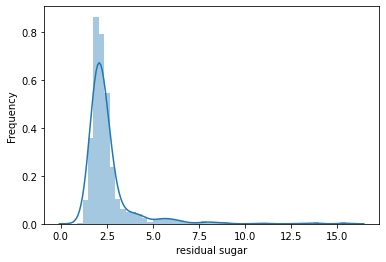

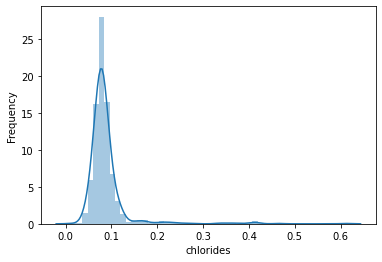

...

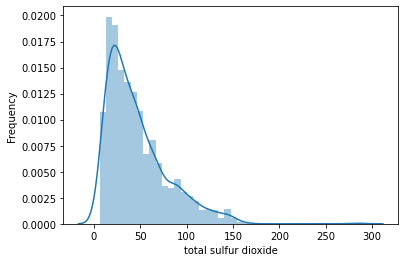

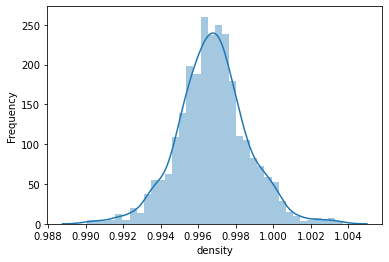

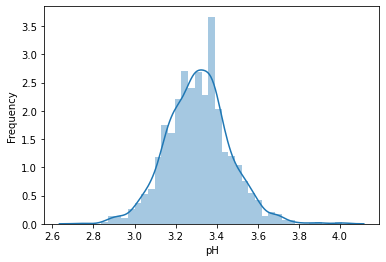

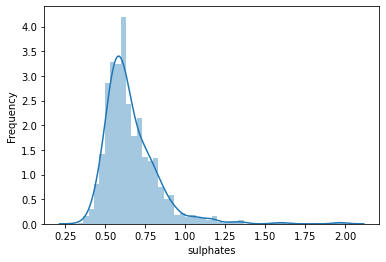

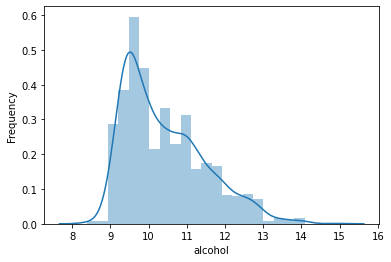

In [28]:
for col in X:
    plt.figure()
    sns.distplot(X[col])
    plt.ylabel("Frequency")
    plt.show()

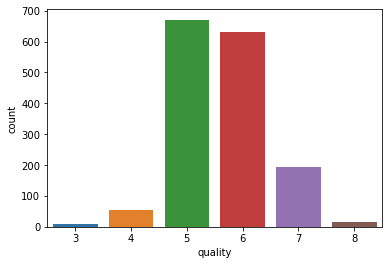

In [29]:
# target count
plt.figure()
sns.countplot(y)
plt.show()

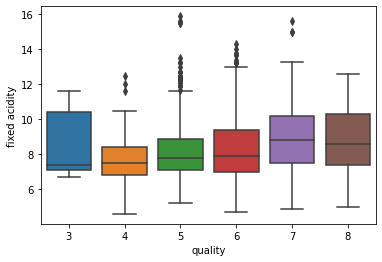

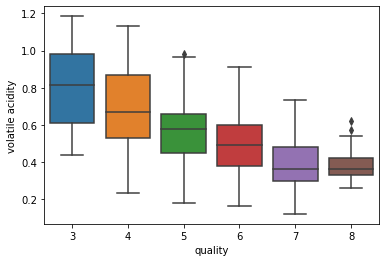

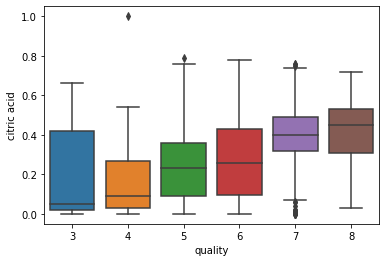

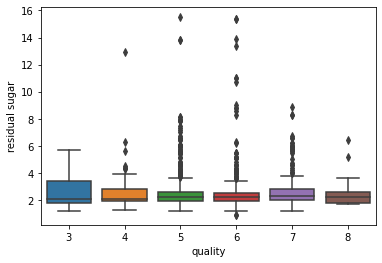

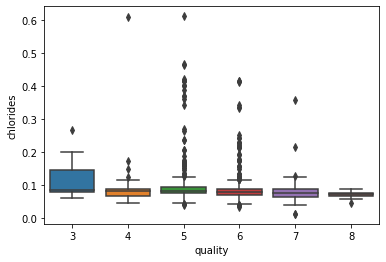

...

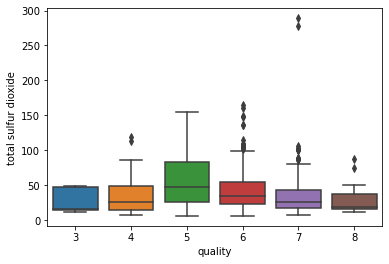

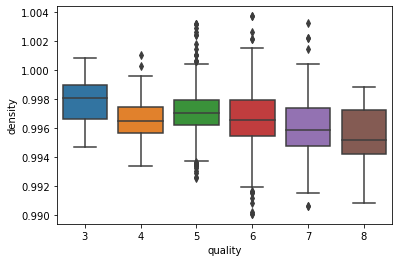

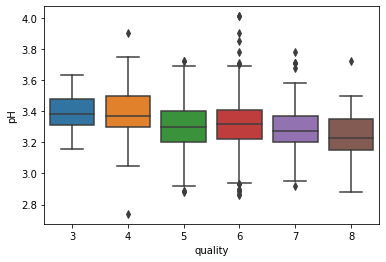

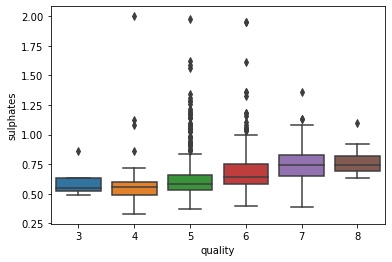

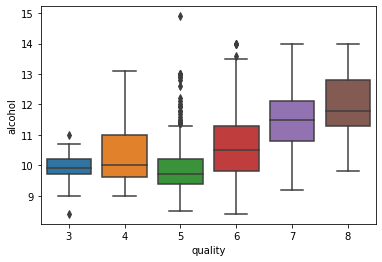

In [30]:
# feature target relationship and outliers
for col in X:
    plt.figure()
    sns.boxplot(data=df, x="quality", y=col)
    plt.show()

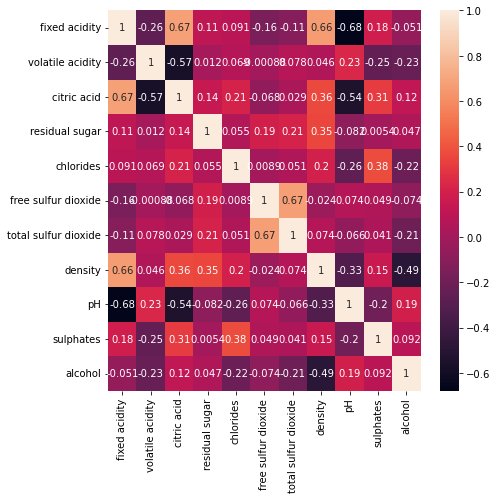

In [31]:
# multi-colinearity
plt.figure(figsize=(7,7))
sns.heatmap(X.corr(), annot=True)
plt.show()

In [32]:
# train test split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=1)

In [33]:
# model
# gini index
model = DecisionTreeClassifier()
model.fit(X_train,y_train)

DecisionTreeClassifier()

In [34]:
# train score
model.score(X_train,y_train)

1.0

In [35]:
# predict
y_pred = model.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.11      0.13      0.12        15
           5       0.68      0.71      0.69       194
           6       0.59      0.58      0.58       193
           7       0.57      0.45      0.50        66
           8       0.20      0.33      0.25         3

    accuracy                           0.60       473
   macro avg       0.36      0.37      0.36       473
weighted avg       0.60      0.60      0.60       473



In [36]:
# entropy

model2 = DecisionTreeClassifier(criterion="entropy")
model2.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [37]:
# predict
y_pred = model2.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.18      0.20      0.19        15
           5       0.69      0.70      0.69       194
           6       0.65      0.61      0.63       193
           7       0.53      0.47      0.50        66
           8       0.08      0.33      0.12         3

    accuracy                           0.61       473
   macro avg       0.35      0.39      0.35       473
weighted avg       0.62      0.61      0.62       473



In [38]:
# prunning
# max depth

model3 = DecisionTreeClassifier(max_depth=8)
model3.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=8)

In [39]:
# predict
y_pred = model3.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.12      0.13      0.13        15
           5       0.67      0.70      0.68       194
           6       0.57      0.61      0.59       193
           7       0.49      0.32      0.39        66
           8       0.33      0.33      0.33         3

    accuracy                           0.58       473
   macro avg       0.36      0.35      0.35       473
weighted avg       0.58      0.58      0.58       473



In [40]:
# min samples leaf
model4 = DecisionTreeClassifier(min_samples_leaf=3)
model4.fit(X_train,y_train)

DecisionTreeClassifier(min_samples_leaf=3)

In [41]:
# predict
y_pred = model4.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.11      0.13      0.12        15
           5       0.67      0.74      0.70       194
           6       0.63      0.61      0.62       193
           7       0.51      0.35      0.41        66
           8       0.50      0.33      0.40         3

    accuracy                           0.61       473
   macro avg       0.40      0.36      0.38       473
weighted avg       0.61      0.61      0.61       473



In [42]:
#RandomOverSampler
from imblearn.over_sampling import RandomOverSampler

In [43]:
rs = RandomOverSampler(random_state=1)
X_train_rs, y_train_rs = rs.fit_resample(X_train,y_train)

In [44]:
y_train_rs.value_counts()

6    477
5    477
7    477
4    477
8    477
3    477
Name: quality, dtype: int64

In [45]:
model5 = DecisionTreeClassifier()
model5.fit(X_train_rs, y_train_rs)

DecisionTreeClassifier()

In [46]:
y_pred = model5.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.10      0.13      0.11        15
           5       0.66      0.71      0.68       194
           6       0.65      0.57      0.61       193
           7       0.52      0.52      0.52        66
           8       0.12      0.33      0.18         3

    accuracy                           0.60       473
   macro avg       0.34      0.38      0.35       473
weighted avg       0.61      0.60      0.60       473



# Random Forest
A random forest is a machine learning technique that’s used to solve regression and classification problems. It utilizes ensemble learning, which is a technique that combines many classifiers to provide solutions to complex problems.

In [47]:
from sklearn.ensemble import RandomForestClassifier

In [48]:
rf = RandomForestClassifier(n_estimators=65, max_depth=20, max_features=8)
rf.fit(X_train_rs, y_train_rs)

RandomForestClassifier(max_depth=20, max_features=8, n_estimators=65)

In [49]:
y_pred = rf.predict(X_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.15      0.13      0.14        15
           5       0.72      0.83      0.77       194
           6       0.71      0.65      0.68       193
           7       0.60      0.48      0.54        66
           8       0.14      0.33      0.20         3

    accuracy                           0.68       473
   macro avg       0.39      0.41      0.39       473
weighted avg       0.68      0.68      0.68       473



In [50]:
# converting multi-class to binary-class

df = pd.read_csv("winequality-red.csv")

In [51]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [52]:
def multi_to_bin(n):
    if n >= 6:
        return 1
    else:
        return 0

In [53]:
df["quality_bin"] = df["quality"].apply(multi_to_bin)

In [54]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_bin
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0


In [55]:
df["quality_bin"].value_counts()

1    855
0    744
Name: quality_bin, dtype: int64

In [56]:
# feature and target split
X = df.drop(["quality_bin","quality"], axis=1)
y = df["quality_bin"]

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=1)

In [58]:
rf = RandomForestClassifier(n_estimators=75)
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=75)

y_pred = rf.predict(X_test)
print(classification_report(y_test,y_pred))

# Boosting
Boosting is an ensemble modeling technique that attempts to build a strong classifier from the number of weak classifiers.


In [59]:
# feature and target
# train test split

X = df.iloc[:,:-1]
y = df.iloc[:,-1]

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=1)

# Adaboost/Adaptive Boosting
AdaBoost also called Adaptive Boosting is a technique in Machine Learning used as an Ensemble Method. The most common algorithm used with AdaBoost is decision trees with one level that means with Decision trees with only 1 split. These trees are also called Decision Stumps.

In [60]:
from sklearn.ensemble import AdaBoostClassifier
model=AdaBoostClassifier(n_estimators=100, random_state=1)
model.fit(X_train,y_train)

AdaBoostClassifier(n_estimators=100, random_state=1)

In [61]:
# prediction
y_pred = model.predict(X_test)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       230
           1       1.00      1.00      1.00       250

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480



# Gradient Boosting
Gradient boosting is a machine learning technique used in regression and classification tasks, among others. It gives a prediction model in the form of an ensemble of weak prediction models, which are typically decision trees.

In [62]:
from sklearn.ensemble import GradientBoostingClassifier

In [63]:
model2 = GradientBoostingClassifier(random_state=1, n_estimators=150, learning_rate=0.2)
model2.fit(X_train,y_train)

GradientBoostingClassifier(learning_rate=0.2, n_estimators=150, random_state=1)

In [64]:
y_pred = model2.predict(X_test)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       230
           1       1.00      1.00      1.00       250

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480



# XG Boost
XGBoost is an ensemble learning method. Sometimes, it may not be sufficient to rely upon the results of just one machine learning model.

In [65]:
from xgboost import XGBClassifier
import warnings
warnings.filterwarnings("ignore")

xgb = XGBClassifier(n_estimators=200,random_state=1)

xgb.fit(X_train,y_train)

[11:43:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [66]:
y_pred = xgb.predict(X_test)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       230
           1       1.00      1.00      1.00       250

    accuracy                           1.00       480
   macro avg       1.00      1.00      1.00       480
weighted avg       1.00      1.00      1.00       480



In [67]:
#Hyper parameter tuning using GridSearchCV
param_grid = {"n_estimators":[25,50,75,100],
              "learning_rate":[0.4,0.5,0.6],
              "min_samples_leaf":[10,20],
              "max_depth":[2,3,4,5,6]}

In [68]:
#model
gbc=GradientBoostingClassifier(random_state=1)

In [69]:
#GridSearch 
from sklearn.model_selection import GridSearchCV
gs=GridSearchCV(gbc,param_grid,cv=2)

In [70]:
gs.fit(X_train,y_train)

GridSearchCV(cv=2, estimator=GradientBoostingClassifier(random_state=1),
             param_grid={'learning_rate': [0.4, 0.5, 0.6],
                         'max_depth': [2, 3, 4, 5, 6],
                         'min_samples_leaf': [10, 20],
                         'n_estimators': [25, 50, 75, 100]})